## Housing Company Assignment

### About the Company

Surprise Housing is a US-based housing company. They have decided to enter the Australian housing market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. 

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

 
#### Problem statement

The company wants to know:
- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression

#### Business Goal 

Model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

#### input :

- train.csv file which contains the previous sale of houses in Australia
- data_description.txt which contains the meta data information of train.csv file

In [1]:
# importing python libraries required for the analysis
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msgno # for analysing missing values
import numpy as np
import seaborn as sb #for visualization
from sklearn.model_selection import train_test_split # for splitting train & test data sets
from sklearn.preprocessing import scale # for scaling the required variables in data set
from sklearn.linear_model import LinearRegression # linear model building
from sklearn.feature_selection import RFE # importing for Recursive Feature Elimination
import statsmodels.api as sm #for model building
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

Read the input train.csv file. This file is assumed to be in the same folder as of the code
Also, have a quick bird eye view of the contents of the file

In [2]:
#FILE READ

#read the loan file using pandas library
hsgData = pd.read_csv('./train.csv')
#Quick look at the header
hsgData.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
#Analyse the data set
print(hsgData.shape)
hsgData.describe()

(1460, 81)


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [4]:
#Analyse the data set
hsgData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

<AxesSubplot: >

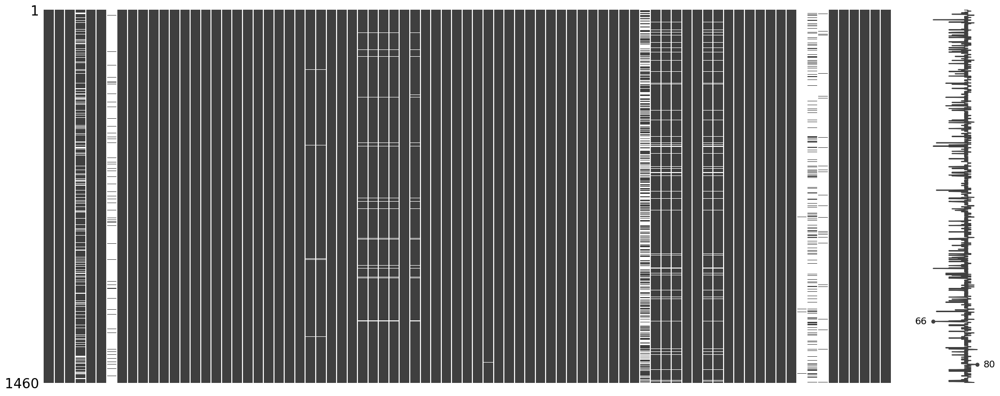

In [5]:
#check any columns having missing values
hsgData.isnull().sum()
#visualize the missing values in columns
msgno.matrix(hsgData) 

In [6]:
#Looks like there are many columns with missing values. Lets try to understand these columns better
pd.options.display.max_rows = 1000
round(hsgData.isnull().sum()/len(hsgData.index)*100,2).sort_values()

Id                0.00
TotalBsmtSF       0.00
Heating           0.00
SaleCondition     0.00
CentralAir        0.00
1stFlrSF          0.00
2ndFlrSF          0.00
LowQualFinSF      0.00
GrLivArea         0.00
BsmtFullBath      0.00
BsmtHalfBath      0.00
FullBath          0.00
HalfBath          0.00
BedroomAbvGr      0.00
KitchenAbvGr      0.00
KitchenQual       0.00
TotRmsAbvGrd      0.00
Functional        0.00
SaleType          0.00
YrSold            0.00
MoSold            0.00
MiscVal           0.00
PoolArea          0.00
ScreenPorch       0.00
BsmtUnfSF         0.00
3SsnPorch         0.00
OpenPorchSF       0.00
WoodDeckSF        0.00
PavedDrive        0.00
GarageArea        0.00
GarageCars        0.00
Fireplaces        0.00
EnclosedPorch     0.00
BsmtFinSF2        0.00
HeatingQC         0.00
SalePrice         0.00
LandSlope         0.00
LandContour       0.00
LotShape          0.00
Neighborhood      0.00
Condition1        0.00
Street            0.00
LotArea           0.00
MSZoning   

In [7]:
#Dropping values with more than 90% null values
hsgData.drop(['Alley','MiscFeature','PoolQC', 'Fence'],axis=1,inplace = True)
hsgData.drop(['Id'],axis=1,inplace = True)

<AxesSubplot: >

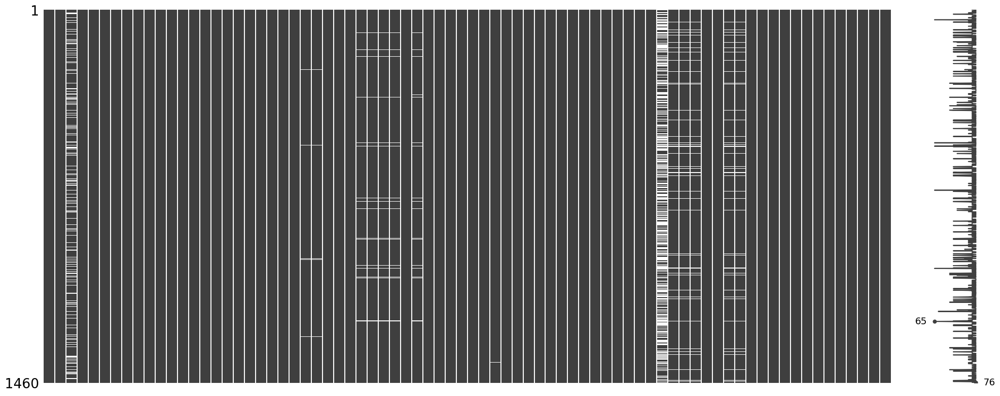

In [8]:
#check again on any columns having missing values
hsgData.isnull().sum()
#visualize the missing values in columns
msgno.matrix(hsgData) 

In [9]:
#LotFrontage has NaN values. replace it with 0
hsgData['LotFrontage'].fillna('0', inplace = True)

In [10]:
hsgData.corr()

/var/folders/dt/9p_fdpvn1lz7gcclv_4_v6780000gp/T/ipykernel_78577/671840423.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  hsgData.corr()


,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,-0.065649,-0.140759,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotArea,-0.139781,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.022936,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,...,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.069836,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,-0.065649,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.072319,-0.050117,1.000000,-0.209294,...,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378
BsmtUnfSF,-0.140759,-0.002618,0.308159,-0.136841,0.149040,0.181133,0.114442,-0.495251,-0.209294,1.000000,...,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.034888,-0.041258,0.214479


In [11]:
#lets see how the values are corelated
sb.set(font_scale=5)
plt.figure(figsize=(120,90))
sb.heatmap(hsgData.corr(),cmap="RdYlGn",annot=True)
plt.show()

/var/folders/dt/9p_fdpvn1lz7gcclv_4_v6780000gp/T/ipykernel_78577/2662556167.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sb.heatmap(hsgData.corr(),cmap="RdYlGn",annot=True)


From the heatmap above, its very evident that following variables are highly correlated to SalesPrice(target variable)
- OverallQual
- YearBuilt
- YearRemodAdd
- MasVnrArea
- Fireplaces
- GarageYrBlt
- TotalBsmtSF
- 1stFlrSF
- GrLivArea
- FullBath
- TotRmsAbvGrd
- GarageCars
- GarageArea


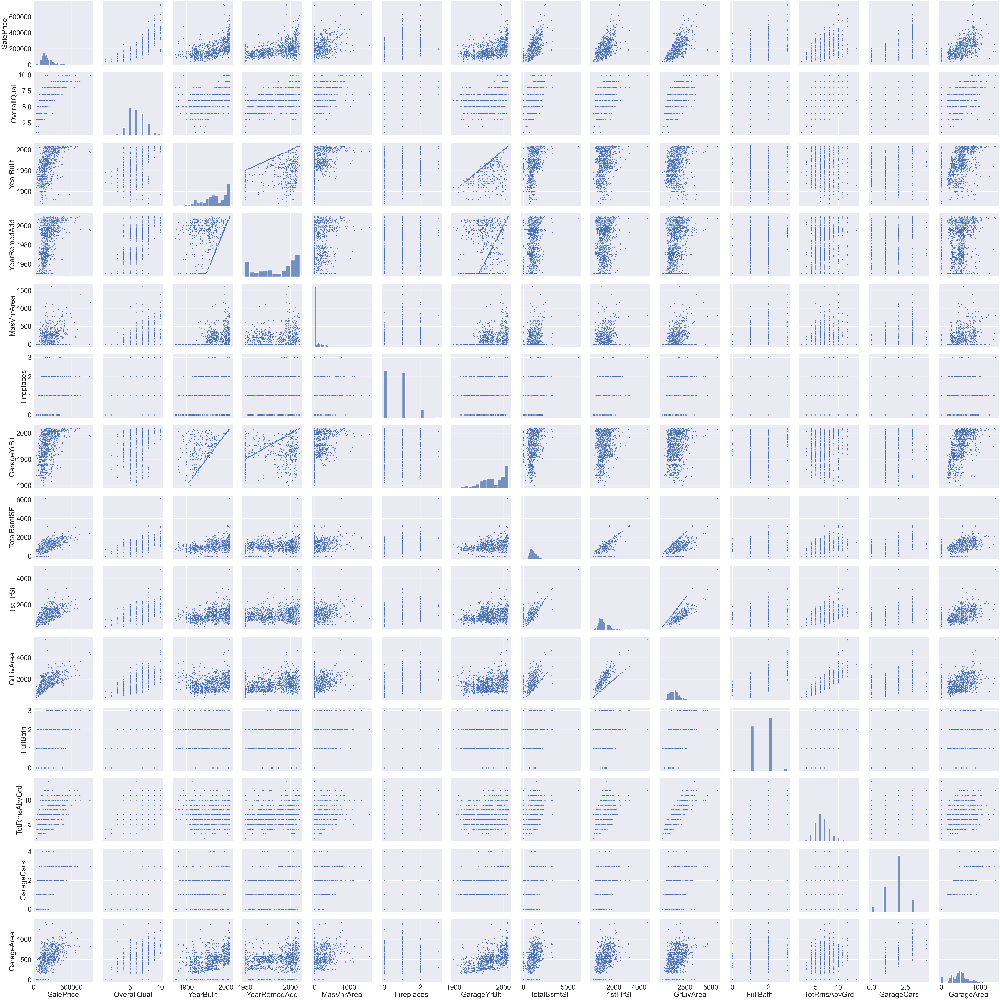

In [12]:
# Checking the same with a pairplot
sb.set(font_scale=3)
cols = ['SalePrice', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'GarageYrBlt', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea','FullBath','TotRmsAbvGrd', 'GarageCars', 'GarageArea']
sb.pairplot(hsgData[cols], height = 5)
plt.show()

from the plot above its clear that some of the predictors also are correlated
like TotalBsmtSF & 1stFlrSF, GrLivArea & 1stFlrSF, TotalBsmtSF & GrLivArea

In [13]:
hsgData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   object 
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [14]:
#check the distribution of values across columns
for i in hsgData:
    print(hsgData[i].value_counts())

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
0        259
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
90.0      23
21.0      23
64.0      19
24.0      19
68.0      19
73.0      18
55.0      17
72.0      17
63.0      17
79.0      17
100.0     16
66.0      15
51.0      15
74.0      15
52.0      14
59.0      13
82.0      12
71.0      12
67.0      12
57.0      12
43.0      12
40.0      12
76.0      11
69.0      11
88.0      10
34.0      10
53.0      10
86.0      10
92.0      10
35.0       9
84.0       9
44.0       9
77.0       9
62.0       9
61.0       8
93.0       8
96.0       8
98.0       8
120.0      7
107.0      7
58.0       7
95.0       7
30.0       6
41.0       6
110.0 

In [15]:
#dropping columns with high correlation or having variables of less impact
hsgData.drop(['BsmtCond','BsmtFinType2','BsmtExposure','GarageQual','GarageYrBlt','GarageCond','MasVnrArea'],axis=1,inplace = True)

In [16]:
#Lets visualize the categorical variables against the target variable 'SalesPrice' and see the impact.
#For that first convert the type to category
for f in hsgData.columns:
    if hsgData.dtypes[f] == 'object': #filter object type columns
        hsgData[f] = hsgData[f].astype('category') #make it as categorical

In [17]:
hsgData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 69 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1460 non-null   category
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   LotShape       1460 non-null   category
 6   LandContour    1460 non-null   category
 7   Utilities      1460 non-null   category
 8   LotConfig      1460 non-null   category
 9   LandSlope      1460 non-null   category
 10  Neighborhood   1460 non-null   category
 11  Condition1     1460 non-null   category
 12  Condition2     1460 non-null   category
 13  BldgType       1460 non-null   category
 14  HouseStyle     1460 non-null   category
 15  OverallQual    1460 non-null   int64   
 16  OverallCond    1460 non-null   int64   
 17  YearBuilt      1460 non-null   in

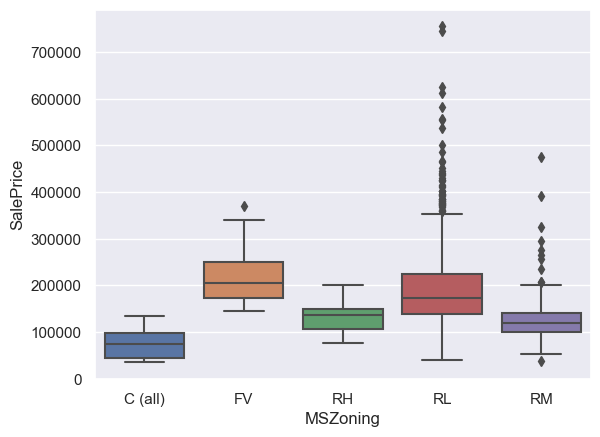

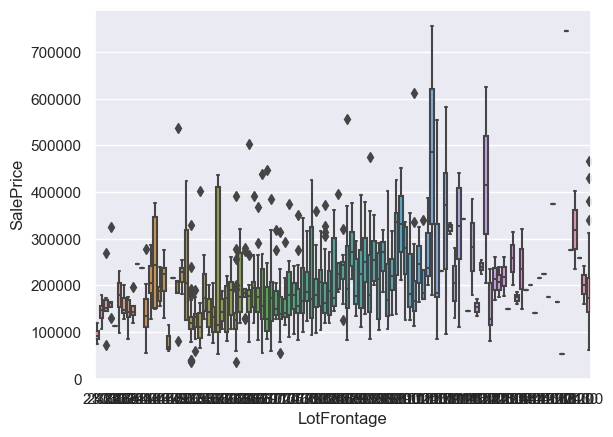

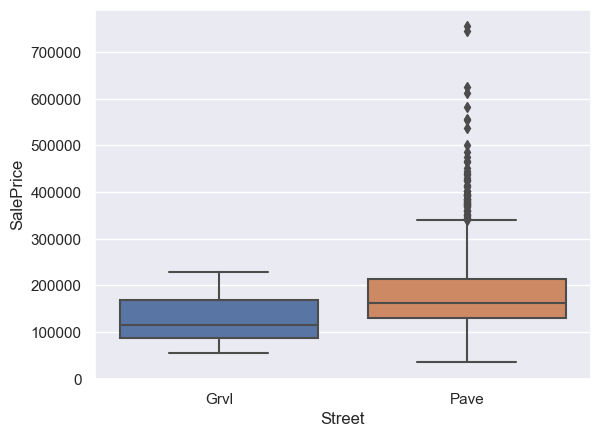

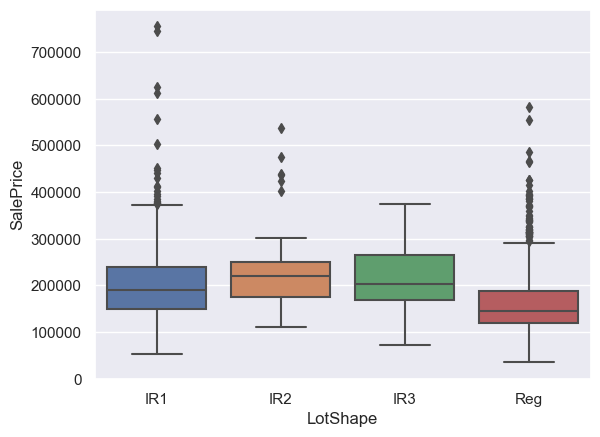

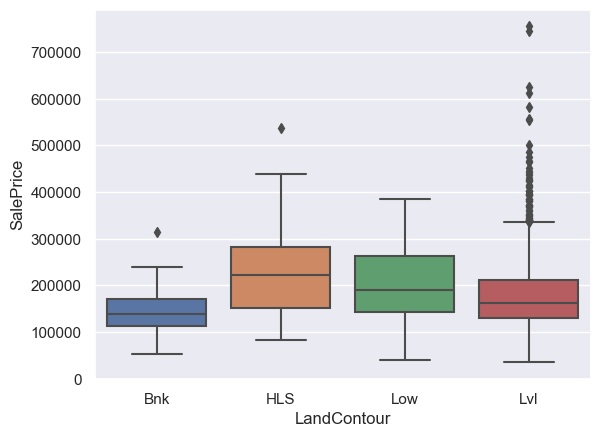

...

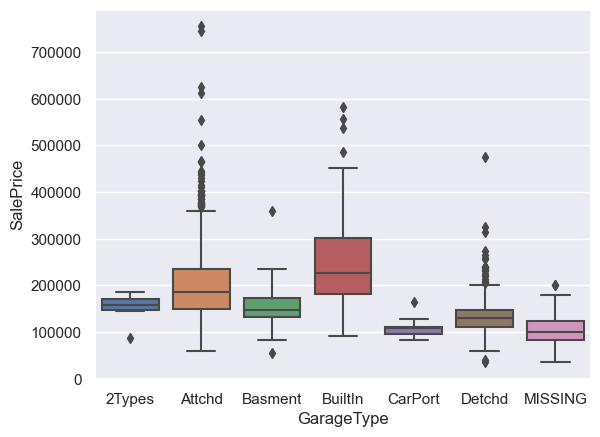

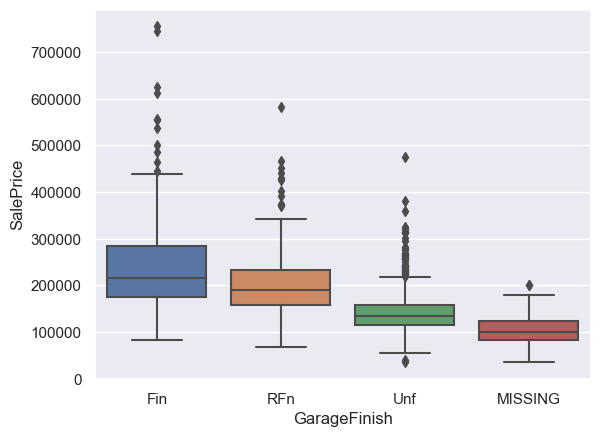

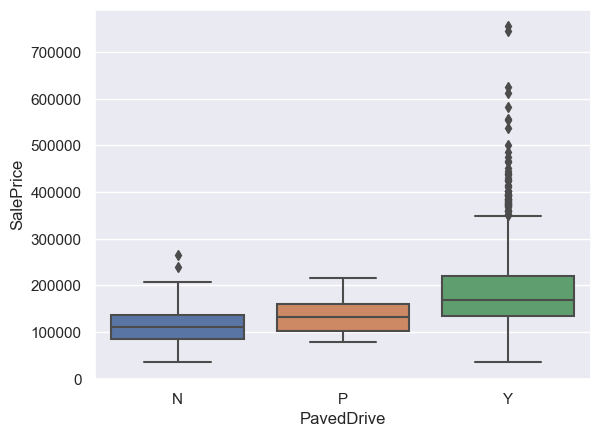

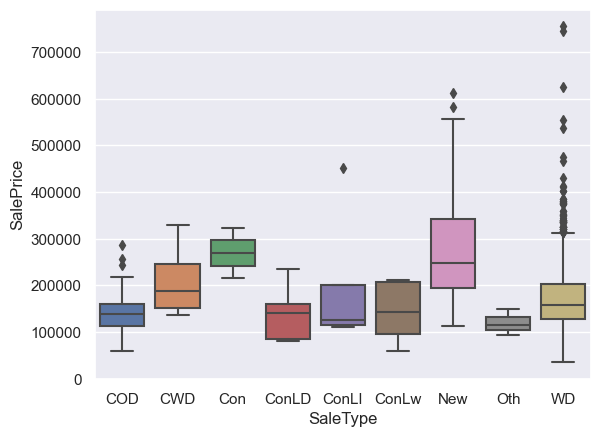

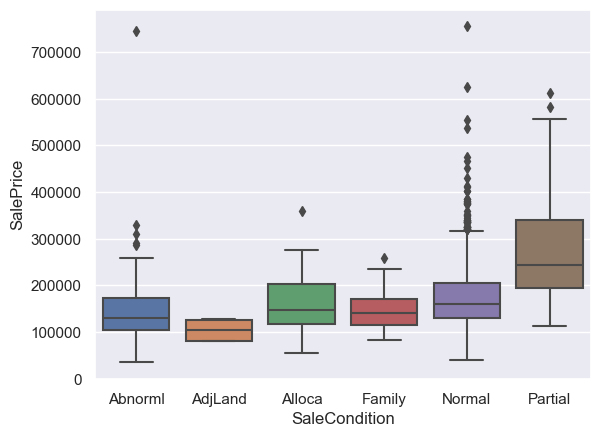

In [18]:
for f in hsgData.columns:
    if hsgData.dtypes[f] == 'category': #filter category type columns
        if hsgData[f].isnull().any():
            hsgData[f] = hsgData[f].cat.add_categories(['MISSING'])
            hsgData[f] = hsgData[f].fillna('MISSING') #add new category for NaN values
        sb.set(font_scale=1)
        sb.boxplot(x=f,y='SalePrice',data=hsgData)
        plt.show()


In [19]:
hsgData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 69 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1460 non-null   category
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   LotShape       1460 non-null   category
 6   LandContour    1460 non-null   category
 7   Utilities      1460 non-null   category
 8   LotConfig      1460 non-null   category
 9   LandSlope      1460 non-null   category
 10  Neighborhood   1460 non-null   category
 11  Condition1     1460 non-null   category
 12  Condition2     1460 non-null   category
 13  BldgType       1460 non-null   category
 14  HouseStyle     1460 non-null   category
 15  OverallQual    1460 non-null   int64   
 16  OverallCond    1460 non-null   int64   
 17  YearBuilt      1460 non-null   in

Observations from above box plots
- Sale Prices are high for "Floating Village Residential" & "Residential Low Density" zones
- If road access to property is "Pave" then the prices are high compared to Gravel
- Stone Brook & Northridge Heights Neighbour good has higher Sales price
- Within 200' of North-South Railroad has high sales price
- Sales price is high for properties "Near positive off-site feature--park, greenbelt, etc."
- Sales price is high if the the roofing material used is Wood Shingles
- If exterior is "Cement Board" then the Sales price is high
- If Masonry veneer type is Stone then it fetches high price
- Evaluates the quality of the material on the exterior is excellent then the price will be high and lowest for Fair type
- If Foundation is Poured Contrete	then the price is high
- Evaluates the height of the basement is "Excellent (100+ inches)" then the Sale price is high
- Heating using Gas has higher price
- Kitchen quality with excellent condition gives higher sales price
- Builtin Garage fetches higher price
- Home condition in partially built state fetches higher price


### Start building model

In [20]:
#create a data backup
hsgData1 = hsgData
catCols = hsgData1.select_dtypes(include=['category']) #get all categorical variables
catCols.head() 

,MSZoning,LotFrontage,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,PavedDrive,SaleType,SaleCondition
0,RL,65.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Y,SBrkr,Gd,Typ,MISSING,Attchd,RFn,Y,WD,Normal
1,RL,80.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Y,WD,Normal
2,RL,68.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,Y,WD,Normal
3,RL,60.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,Y,WD,Abnorml
4,RL,84.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,Y,WD,Normal


In [21]:
hsgData1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 69 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1460 non-null   category
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   LotShape       1460 non-null   category
 6   LandContour    1460 non-null   category
 7   Utilities      1460 non-null   category
 8   LotConfig      1460 non-null   category
 9   LandSlope      1460 non-null   category
 10  Neighborhood   1460 non-null   category
 11  Condition1     1460 non-null   category
 12  Condition2     1460 non-null   category
 13  BldgType       1460 non-null   category
 14  HouseStyle     1460 non-null   category
 15  OverallQual    1460 non-null   int64   
 16  OverallCond    1460 non-null   int64   
 17  YearBuilt      1460 non-null   in

In [22]:
catCols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSZoning       1460 non-null   category
 1   LotFrontage    1460 non-null   category
 2   Street         1460 non-null   category
 3   LotShape       1460 non-null   category
 4   LandContour    1460 non-null   category
 5   Utilities      1460 non-null   category
 6   LotConfig      1460 non-null   category
 7   LandSlope      1460 non-null   category
 8   Neighborhood   1460 non-null   category
 9   Condition1     1460 non-null   category
 10  Condition2     1460 non-null   category
 11  BldgType       1460 non-null   category
 12  HouseStyle     1460 non-null   category
 13  RoofStyle      1460 non-null   category
 14  RoofMatl       1460 non-null   category
 15  Exterior1st    1460 non-null   category
 16  Exterior2nd    1460 non-null   category
 17  MasVnrType     1460 non-null   ca

In [23]:
hsgData1.shape

(1460, 69)

In [24]:
dummyCols = pd.get_dummies(catCols)
dummyCols.head()
hsgData1 = hsgData1.drop(list(catCols.columns),axis=1)
hsgData1 = pd.concat([hsgData1, dummyCols], axis=1)

In [25]:
hsgData1.shape

(1460, 367)

In [26]:
dummyCols.shape

(1460, 333)

In [27]:
hsgData1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 367 entries, MSSubClass to SaleCondition_Partial
dtypes: int64(34), uint8(333)
memory usage: 862.7 KB


/var/folders/dt/9p_fdpvn1lz7gcclv_4_v6780000gp/T/ipykernel_78577/195601037.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(hsgData1['SalePrice'])


<AxesSubplot: xlabel='SalePrice', ylabel='Density'>

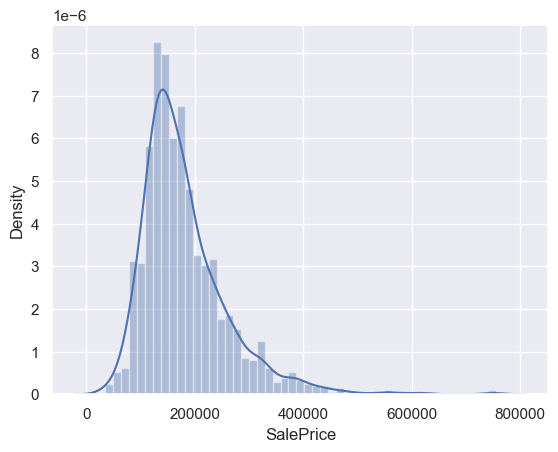

In [28]:
#inspect the data distribution of target variable
sb.distplot(hsgData1['SalePrice'])

In [29]:
#As we have in the dist plot above, the data distribution is skewed towards left and better to center it. 
#For that we will log
hsgData1['SalePrice'] = np.log1p(hsgData1['SalePrice'])

/var/folders/dt/9p_fdpvn1lz7gcclv_4_v6780000gp/T/ipykernel_78577/3653081381.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(hsgData1['SalePrice'])


<AxesSubplot: xlabel='SalePrice', ylabel='Density'>

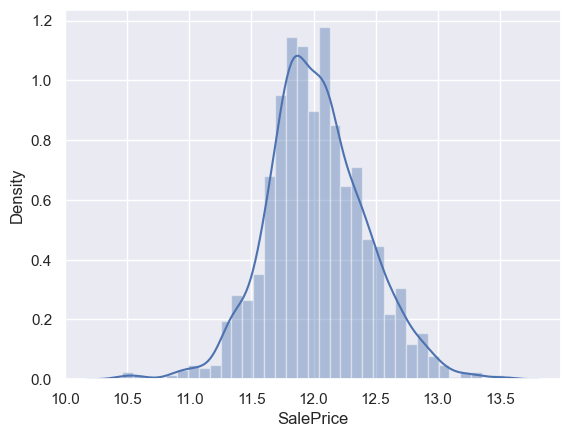

In [30]:
#inspect the data distribution of target variable after applying log
sb.distplot(hsgData1['SalePrice'])

In [31]:
y = hsgData1['SalePrice']
#y = hsgData1['SalePrice'] #take out the target column
hsgData1.drop(['SalePrice'],axis=1,inplace=True)


In [32]:
#Get all numerical columns. This list will be used later for scaling
numCols = hsgData1.select_dtypes(include=['float64', 'int64'] ).columns
numCols

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [33]:
hsgData1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 366 entries, MSSubClass to SaleCondition_Partial
dtypes: int64(33), uint8(333)
memory usage: 851.3 KB


In [34]:
#As we have seen in the data distribution, we have to rescale the numeric data
cols = hsgData1.columns
hsgData1 = pd.DataFrame(scale(hsgData1))
hsgData1.columns = cols
hsgData1.columns

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       ...
       'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth', 'SaleType_WD',
       'SaleCondition_Abnorml', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=366)

In [35]:
X = hsgData1

In [36]:
#Split train and test data in 70-30%
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [37]:
X_test.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1436,-0.872563,-0.152020,-1.518467,0.381743,-0.008870,-0.671845,0.378031,-0.288653,-0.722728,-0.441061,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
57,0.073375,0.113068,0.651479,-0.517200,1.084115,0.927122,-0.973018,-0.288653,0.662778,-0.450182,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
780,-0.872563,-0.264769,0.651479,-0.517200,0.786028,0.539493,-0.973018,-0.288653,1.516269,0.409460,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
382,0.073375,-0.127465,0.651479,-0.517200,1.150356,1.024029,-0.973018,-0.288653,0.841627,-0.270045,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
1170,0.546344,-0.063824,-0.071836,0.381743,0.189854,-0.381123,0.171865,-0.288653,0.015303,0.087949,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995


In [38]:
X_train.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
210,-0.636078,-0.492374,-0.795151,0.381743,-1.532424,-1.689368,0.053428,-0.288653,-0.387671,-0.441061,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
318,0.073375,-0.061820,0.651479,-0.517200,0.719786,0.394133,1.191731,-0.288653,-0.469172,0.660283,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
239,-0.163109,-0.177977,-0.071836,-1.416142,-0.870009,-1.689368,-0.766852,-0.288653,0.166984,-0.735209,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
986,-0.163109,-0.521839,-0.071836,2.179628,-2.029235,0.878668,-0.973018,-0.288653,-0.186184,-1.305262,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995
1416,3.147673,0.082500,-1.518467,0.381743,-2.857254,-1.689368,-0.973018,-0.288653,0.474875,-0.639440,...,-0.058621,-0.301962,-0.045376,0.390293,-0.272616,-0.052414,-0.091035,-0.117851,0.467651,-0.305995


# Model Building and evaluation

In [39]:
#Lets first try to build. the model using linear regression
#Since there are too many predictor variables, its better to use some automated technique to figure out final variables
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, n_features_to_select=100)            
rfe = rfe.fit(X_train, y_train)

In [40]:
#Now inspect the columns selected by RFE and their ranks
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', False, 258),
 ('LotArea', False, 244),
 ('OverallQual', False, 240),
 ('OverallCond', False, 242),
 ('YearBuilt', False, 241),
 ('YearRemodAdd', False, 245),
 ('BsmtFinSF1', False, 238),
 ('BsmtFinSF2', False, 239),
 ('BsmtUnfSF', False, 237),
 ('TotalBsmtSF', False, 236),
 ('1stFlrSF', False, 233),
 ('2ndFlrSF', False, 234),
 ('LowQualFinSF', False, 235),
 ('GrLivArea', False, 232),
 ('BsmtFullBath', False, 248),
 ('BsmtHalfBath', False, 256),
 ('FullBath', False, 254),
 ('HalfBath', False, 255),
 ('BedroomAbvGr', False, 259),
 ('KitchenAbvGr', False, 246),
 ('TotRmsAbvGrd', False, 264),
 ('Fireplaces', False, 257),
 ('GarageCars', False, 247),
 ('GarageArea', False, 243),
 ('WoodDeckSF', False, 249),
 ('OpenPorchSF', False, 260),
 ('EnclosedPorch', False, 252),
 ('3SsnPorch', False, 251),
 ('ScreenPorch', False, 250),
 ('PoolArea', False, 261),
 ('MiscVal', False, 265),
 ('MoSold', False, 267),
 ('YrSold', False, 253),
 ('MSZoning_C (all)', True, 1),
 ('MSZoning_FV', 

In [41]:
#Lets see what all columns selected by RFE and what all rejected
print(X_train.columns[rfe.support_])
print(X_train.columns[~rfe.support_])

Index(['MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'LotFrontage_33.0', 'LotFrontage_97.0',
       'LotFrontage_111.0', 'LotFrontage_140.0', 'LotFrontage_152.0',
       'LotFrontage_313.0', 'Street_Grvl', 'Street_Pave', 'Utilities_AllPub',
       'Utilities_NoSeWa', 'Condition1_Artery', 'Condition1_Feedr',
       'Condition1_Norm', 'Condition1_PosA', 'Condition1_PosN',
       'Condition1_RRAe', 'Condition1_RRAn', 'Condition1_RRNe',
       'Condition1_RRNn', 'Condition2_Artery', 'Condition2_Feedr',
       'Condition2_Norm', 'Condition2_PosA', 'Condition2_PosN',
       'Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn',
       'BldgType_1Fam', 'BldgType_2fmCon', 'BldgType_Duplex', 'BldgType_Twnhs',
       'BldgType_TwnhsE', 'HouseStyle_1.5Fin', 'HouseStyle_1.5Unf',
       'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf',
       'HouseStyle_2Story', 'HouseStyle_SFoyer', 'HouseStyle_SLvl',
       'RoofMatl_ClyTile', 'Exterior1st_A

In [42]:
# predict using train data set
y_train_pred = lm.predict(X_train)
r2_score(y_true=y_train, y_pred=y_train_pred)

0.9619786869432593

In [43]:
# predict using test data set
y_test_pred = lm.predict(X_test)
r2_score(y_true=y_test, y_pred=y_test_pred)

-3.3906064386412944e+25

#### the r2 score for test data set is too low and for the train data set it looks very good. Looks like we need to seek for some other options here
### Lets try Ridge and Lasso regression methods now

### Lasso regression

In [44]:
# Try with following list of alphas
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


In [45]:
lasso = Lasso()

# cross validation
folds = 5 # here we will try 5 & 28 = 140 fits
model_cv_l = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_l.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


/usr/local/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.113e-02, tolerance: 1.304e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.353e-02, tolerance: 1.273e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.456e-02, tolerance: 1.314e-02

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [46]:
# cv_results
cv_results_l = pd.DataFrame(model_cv_l.cv_results_)
cv_results_l = cv_results_l[cv_results_l['param_alpha']<=1]
cv_results_l.head(1000)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.140441,0.007208,0.004592,0.000969,0.0001,{'alpha': 0.0001},-0.097412,-0.098061,-0.104497,-0.084413,...,-0.094603,0.007173,3,-0.051587,-0.052405,-0.051207,-0.053876,-0.051975,-0.052210,0.000924
1,0.044530,0.002979,0.004618,0.000431,0.001,{'alpha': 0.001},-0.086303,-0.093087,-0.094594,-0.073566,...,-0.084935,0.008389,1,-0.054915,-0.054604,-0.054359,-0.056629,-0.054998,-0.055101,0.000797
2,0.012449,0.001087,0.004915,0.000312,0.01,{'alpha': 0.01},-0.078491,-0.098047,-0.091168,-0.075066,...,-0.085162,0.008403,2,-0.075135,-0.074383,-0.074456,-0.076361,-0.076274,-0.075322,0.000855
3,0.009437,0.000344,0.004757,0.000167,0.05,{'alpha': 0.05},-0.113165,-0.131796,-0.123782,-0.121178,...,-0.123057,0.006060,4,-0.124923,-0.113700,-0.117101,-0.121874,-0.123987,-0.120317,0.004272
4,0.008417,0.001199,0.004757,0.000181,0.1,{'alpha': 0.1},-0.156139,-0.170042,-0.160872,-0.158608,...,-0.161694,0.004733,5,-0.162582,-0.155038,-0.159267,-0.160778,-0.164799,-0.160493,0.003294
5,0.007612,0.000284,0.004747,0.000175,0.2,{'alpha': 0.2},-0.231797,-0.240116,-0.231277,-0.220797,...,-0.233424,0.007819,6,-0.231195,-0.231401,-0.232568,-0.230416,-0.236448,-0.232406,0.002136
6,0.007235,0.000154,0.004500,0.000045,0.3,{'alpha': 0.3},-0.293942,-0.296625,-0.289707,-0.278326,...,-0.294084,0.010849,7,-0.291063,-0.290612,-0.294564,-0.293778,-0.296720,-0.293347,0.002269
7,0.006842,0.000382,0.003886,0.000664,0.4,{'alpha': 0.4},-0.313293,-0.313482,-0.305874,-0.296959,...,-0.310645,0.008869,8,-0.309930,-0.308825,-0.311151,-0.312979,-0.307373,-0.310052,0.001922
8,0.008086,0.000412,0.004454,0.000531,0.5,{'alpha': 0.5},-0.313293,-0.313482,-0.305874,-0.296959,...,-0.310645,0.008869,8,-0.309930,-0.308825,-0.311151,-0.312979,-0.307373,-0.310052,0.001922
9,0.007689,0.000555,0.004890,0.000317,0.6,{'alpha': 0.6},-0.313293,-0.313482,-0.305874,-0.296959,...,-0.310645,0.008869,8,-0.309930,-0.308825,-0.311151,-0.312979,-0.307373,-0.310052,0.001922


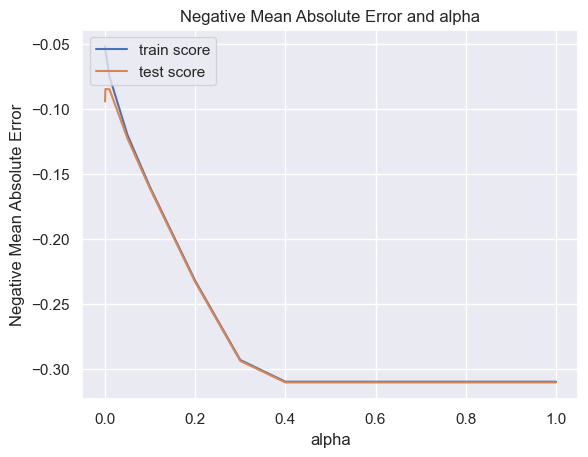

In [47]:
# plotting mean test and train scoes with alpha 
cv_results_l['param_alpha'] = cv_results_l['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_l['param_alpha'], cv_results_l['mean_train_score'])
plt.plot(cv_results_l['param_alpha'], cv_results_l['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [48]:
# lasso regression
lasso = Lasso(alpha=0.01)
lasso.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred_l = lasso.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred_l))
y_test_pred_l = lasso.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred_l))

0.92950038628065
0.8745352195642451


In [49]:
print('RMSE :', np.sqrt(mean_squared_error(y_test, y_test_pred_l)))

RMSE : 0.14367920411405125


In [50]:
lasso.coef_

array([-0.00000000e+00,  1.53725093e-02,  9.18264977e-02,  2.74843987e-02,
        5.04723327e-02,  2.65567531e-02,  2.21090954e-02,  0.00000000e+00,
       -0.00000000e+00,  4.19458384e-02,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  1.30307554e-01,  1.20208656e-02,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -4.53098778e-03,
        0.00000000e+00,  9.11444376e-03,  1.85937816e-02,  2.50251093e-02,
        5.39917270e-03,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -2.39042754e-02,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -2.03956171e-02, -7.95972560e-03, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -

### Ridge Regression

In [51]:
# Try with following list of alphas
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5 # here we will try 5 & 28 = 140 fits
model_cv_r = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv_r.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [52]:
cv_results_r = pd.DataFrame(model_cv_r.cv_results_)
cv_results_r = cv_results_r[cv_results_r['param_alpha']<=1000]
cv_results_r.head(1000)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010778,0.001146,0.004266,0.000712,0.0001,{'alpha': 0.0001},-0.099198,-0.100013,-0.106872,-0.087314,...,-0.097026,0.006825,27,-0.051448,-0.052310,-0.051131,-0.053683,-0.051840,-0.052082,0.000892
1,0.010121,0.000696,0.004684,0.000173,0.001,{'alpha': 0.001},-0.099198,-0.100013,-0.106871,-0.087314,...,-0.097025,0.006825,26,-0.051448,-0.052310,-0.051131,-0.053683,-0.051840,-0.052082,0.000892
2,0.010514,0.000296,0.004755,0.000121,0.01,{'alpha': 0.01},-0.099196,-0.100011,-0.106868,-0.087310,...,-0.097022,0.006826,25,-0.051448,-0.052310,-0.051131,-0.053683,-0.051840,-0.052082,0.000892
3,0.010566,0.000200,0.006868,0.004992,0.05,{'alpha': 0.05},-0.099189,-0.100001,-0.106852,-0.087293,...,-0.097006,0.006830,24,-0.051448,-0.052309,-0.051131,-0.053683,-0.051841,-0.052082,0.000892
4,0.010447,0.000301,0.004457,0.000228,0.1,{'alpha': 0.1},-0.099181,-0.099990,-0.106832,-0.087271,...,-0.096986,0.006835,23,-0.051447,-0.052308,-0.051131,-0.053683,-0.051842,-0.052082,0.000892
5,0.010901,0.000674,0.004958,0.000195,0.2,{'alpha': 0.2},-0.099164,-0.099970,-0.106793,-0.087229,...,-0.096947,0.006845,22,-0.051447,-0.052307,-0.051131,-0.053683,-0.051844,-0.052082,0.000892
6,0.011009,0.000590,0.004491,0.000203,0.3,{'alpha': 0.3},-0.099147,-0.099951,-0.106754,-0.087186,...,-0.096908,0.006855,21,-0.051446,-0.052306,-0.051131,-0.053683,-0.051847,-0.052083,0.000892
7,0.010445,0.000983,0.004467,0.000481,0.4,{'alpha': 0.4},-0.099130,-0.099933,-0.106715,-0.087144,...,-0.096870,0.006865,20,-0.051446,-0.052305,-0.051132,-0.053684,-0.051849,-0.052083,0.000892
8,0.010325,0.000300,0.004241,0.000620,0.5,{'alpha': 0.5},-0.099113,-0.099914,-0.106676,-0.087103,...,-0.096832,0.006874,19,-0.051446,-0.052304,-0.051132,-0.053684,-0.051851,-0.052083,0.000892
9,0.010258,0.000457,0.004016,0.000683,0.6,{'alpha': 0.6},-0.099096,-0.099896,-0.106639,-0.087061,...,-0.096795,0.006884,18,-0.051445,-0.052303,-0.051133,-0.053684,-0.051854,-0.052084,0.000891


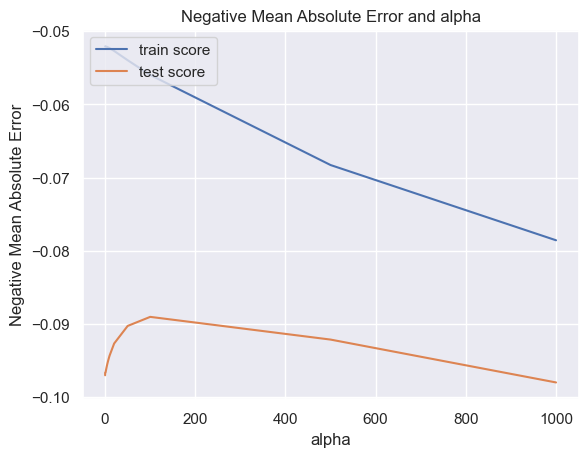

In [53]:
# plotting mean test and train scoes with alpha 
cv_results_r['param_alpha'] = cv_results_r['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results_r['param_alpha'], cv_results_r['mean_train_score'])
plt.plot(cv_results_r['param_alpha'], cv_results_r['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [54]:
# ridge regression
ridge = Ridge(alpha=100)
ridge.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred_r = ridge.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred_r))
y_test_pred_r = ridge.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred_r))

0.9584174334356247
0.8740296068722688


In [55]:
print('RMSE :', np.sqrt(mean_squared_error(y_test, y_test_pred_r)))

RMSE : 0.14396842068403765


In [56]:
ridge.coef_

array([-2.74982847e-03,  1.86212364e-02,  4.87377623e-02,  2.99998863e-02,
        2.38608802e-02,  2.03680784e-02,  2.45486515e-02,  6.59204320e-03,
        7.34220990e-03,  3.53410268e-02,  3.86495150e-02,  2.53555977e-02,
       -6.72161907e-04,  4.94351192e-02,  1.47678223e-02,  3.25824998e-03,
        1.56610602e-02,  1.09670475e-02,  5.55794338e-03, -1.15645307e-02,
        1.45323083e-02,  9.95554849e-03,  1.73672675e-02,  2.45508649e-02,
        9.44428279e-03,  2.86264857e-03,  3.27370153e-03,  5.45850071e-03,
        6.02362943e-03, -1.40268873e-03,  5.88730959e-04,  1.88053959e-06,
       -4.08976126e-03, -2.98768244e-02,  5.83247823e-03,  1.89963972e-03,
        6.83313265e-03, -4.84772850e-03, -1.45504869e-02, -2.56448957e-03,
       -1.83282367e-03, -2.82264901e-03,  0.00000000e+00,  9.94242979e-04,
        1.21260081e-03, -3.35418672e-03, -1.25396329e-03, -1.67621748e-04,
       -1.58801379e-03, -4.79406984e-03, -4.35877083e-03,  7.74221683e-03,
       -3.37587310e-03, -

In [57]:
print('RMSE :', np.sqrt(mean_squared_error(y_test, y_test_pred_r)))

RMSE : 0.14396842068403765


## Comparing Linear, Lasso & Ridge models

In [58]:
#Linear model we have already seen that its giving incorrect values for the test data
#Now lets compare Lasso & Ridge models
print('Ridge RMSE :', np.sqrt(mean_squared_error(y_test, y_test_pred_r)))
print('Lasso RMSE :', np.sqrt(mean_squared_error(y_test, y_test_pred_l)))

Ridge RMSE : 0.14396842068403765
Lasso RMSE : 0.14367920411405125


In [59]:
#Now compare the variables for Lasso & Ridge

In [60]:
# ridge model parameters
r_model_parameters = list(ridge.coef_)
r_model_parameters.insert(0, ridge.intercept_)
r_model_parameters = [round(x, 3) for x in r_model_parameters]
rcols = X.columns
rcols = cols.insert(0, "constant")

rparam = pd.DataFrame(list(zip(rcols, r_model_parameters)))
rparam.columns = ['Variable', 'Coeff']
rparam = pd.DataFrame(rparam[(rparam['Coeff'] != 0)])#variables with 0 coefficients are not required
rparam = rparam.sort_values((['Coeff']), axis = 0, ascending = False)
rparam

,Variable,Coeff
0,constant,12.024
3,OverallQual,0.049
14,GrLivArea,0.049
11,1stFlrSF,0.039
10,TotalBsmtSF,0.035
4,OverallCond,0.030
24,GarageArea,0.025
7,BsmtFinSF1,0.025
12,2ndFlrSF,0.025
5,YearBuilt,0.024


In [61]:
rparam.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 325 entries, 0 to 208
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Variable  325 non-null    object 
 1   Coeff     325 non-null    float64
dtypes: float64(1), object(1)
memory usage: 7.6+ KB


In [62]:

# lasso model parameters
l_model_parameters = list(lasso.coef_)
l_model_parameters.insert(0, lasso.intercept_)
l_model_parameters = [round(x, 3) for x in l_model_parameters]
lcols = X.columns
lcols = lcols.insert(0, "constant")

lparam = pd.DataFrame(list(zip(lcols, l_model_parameters)))
lparam.columns = ['Variable', 'Coeff']
lparam = pd.DataFrame(lparam[(lparam['Coeff'] != 0)]) #variables with 0 coefficients are not required
lparam = lparam.sort_values((['Coeff']), axis = 0, ascending = False)
lparam

,Variable,Coeff
0,constant,12.024
14,GrLivArea,0.130
3,OverallQual,0.092
5,YearBuilt,0.050
10,TotalBsmtSF,0.042
4,OverallCond,0.027
6,YearRemodAdd,0.027
24,GarageArea,0.025
7,BsmtFinSF1,0.022
23,GarageCars,0.019


In [63]:
print(rparam.shape)
print(lparam.shape)
print(lparam['Variable'].values)
lparam['combined'] = lparam['Coeff'].astype(str) + '*' + lparam['Variable'] + ' + '
print(lparam['combined'].values)

(325, 2)
(53, 2)
['constant' 'GrLivArea' 'OverallQual' 'YearBuilt' 'TotalBsmtSF'
 'OverallCond' 'YearRemodAdd' 'GarageArea' 'BsmtFinSF1' 'GarageCars'
 'LotArea' 'BsmtQual_Ex' 'Neighborhood_Crawfor' 'BsmtFullBath'
 'Fireplaces' 'KitchenQual_Ex' 'GarageType_Attchd' 'HeatingQC_Ex'
 'BsmtFinType1_GLQ' 'BldgType_1Fam' 'SaleType_New' 'Condition1_Norm'
 'Functional_Typ' 'WoodDeckSF' 'Neighborhood_ClearCr' 'FireplaceQu_Gd'
 'Exterior1st_BrkFace' 'Foundation_PConc' 'LotConfig_CulDSac'
 'GarageFinish_Fin' 'Neighborhood_Somerst' 'Neighborhood_Veenker'
 'Condition1_RRAe' 'Functional_Maj2' 'PavedDrive_N' 'KitchenQual_TA'
 'GarageFinish_Unf' 'LotFrontage_153.0' 'BldgType_Twnhs' 'ExterQual_TA'
 'Functional_Sev' 'Exterior1st_BrkComm' 'Neighborhood_Edwards'
 'KitchenAbvGr' 'Condition1_Artery' 'LotFrontage_21.0'
 'SaleCondition_Abnorml' 'FireplaceQu_MISSING' 'CentralAir_N'
 'MSZoning_RM' 'MSZoning_C (all)' 'Condition2_PosN' 'RoofMatl_ClyTile']
['12.024*constant + ' '0.13*GrLivArea + ' '0.092*OverallQual

## Observations:
####  Model built using linear regression is having a good r2 score for train data; but for test dat it was giving negative score
#### Model performance by Ridge & lasso Regression is giving good r2 scores
#### Model performance by Ridge & lasso Regression is giving good RMSE values
#### Model built using Ridge regression is having 325 features, whereas the one built using Lasso is having only 53 features
#### Lasso regression is helping here to eliminate unwanted features by 0 coeff. This helps to easily identify feature variables and keep it simple and robust
#### Following variables are significant in predicting house price
    'GrLivArea', 'OverallQual', 'YearBuilt', 'TotalBsmtSF',
       'OverallCond', 'YearRemodAdd', 'GarageArea', 'BsmtFinSF1',
       'GarageCars', 'LotArea', 'BsmtQual_Ex', 'Neighborhood_Crawfor',
       'BsmtFullBath', 'Fireplaces', 'KitchenQual_Ex',
       'GarageType_Attchd', 'HeatingQC_Ex', 'BsmtFinType1_GLQ',
       'BldgType_1Fam', 'SaleType_New', 'Condition1_Norm',
       'Functional_Typ', 'WoodDeckSF', 'Neighborhood_ClearCr',
       'FireplaceQu_Gd', 'Exterior1st_BrkFace', 'Foundation_PConc',
       'LotConfig_CulDSac', 'GarageFinish_Fin', 'Neighborhood_Somerst',
       'Neighborhood_Veenker', 'Condition1_RRAe', 'Functional_Maj2',
       'PavedDrive_N', 'KitchenQual_TA', 'GarageFinish_Unf',
       'LotFrontage_153.0', 'BldgType_Twnhs', 'ExterQual_TA',
       'Functional_Sev', 'Exterior1st_BrkComm', 'Neighborhood_Edwards',
       'KitchenAbvGr', 'Condition1_Artery', 'LotFrontage_21.0',
       'SaleCondition_Abnorml', 'FireplaceQu_MISSING', 'CentralAir_N',
       'MSZoning_RM', 'MSZoning_C (all)', 'Condition2_PosN',
       'RoofMatl_ClyTile'
#### To understand how well those variables describe the price of a house, use the following
log(SalePrice) = C + 0.13*GrLivArea + 0.092*OverallQual + 0.05*YearBuilt + 0.042*TotalBsmtSF + 0.027*OverallCond + 0.027*YearRemodAdd + 0.025*GarageArea + 0.022*BsmtFinSF1 + 0.019*GarageCars + 0.015*LotArea + 0.014*BsmtQual_Ex + 0.013*Neighborhood_Crawfor + 0.012*BsmtFullBath + 0.009*Fireplaces + 0.009*KitchenQual_Ex + 0.007*GarageType_Attchd + 0.006*HeatingQC_Ex + 0.006*BsmtFinType1_GLQ + 0.006*BldgType_1Fam + 0.006*SaleType_New + 0.006*Condition1_Norm + 0.005*Functional_Typ + 0.005*WoodDeckSF + 0.004*Neighborhood_ClearCr + 0.004*FireplaceQu_Gd + 0.004*Exterior1st_BrkFace + 0.003*Foundation_PConc + 0.002*LotConfig_CulDSac + 0.002*GarageFinish_Fin + 0.001*Neighborhood_Somerst + 0.001*Neighborhood_Veenker + -0.001*Condition1_RRAe + -0.001*Functional_Maj2 + -0.001*PavedDrive_N + -0.001*KitchenQual_TA + -0.002*GarageFinish_Unf + -0.002*LotFrontage_153.0 + -0.002*BldgType_Twnhs + -0.003*ExterQual_TA + -0.003*Functional_Sev + -0.004*Exterior1st_BrkComm + -0.004*Neighborhood_Edwards + -0.005*KitchenAbvGr + -0.006*Condition1_Artery + -0.008*LotFrontage_21.0 + -0.009*SaleCondition_Abnorml + -0.011*FireplaceQu_MISSING + -0.011*CentralAir_N + -0.02*MSZoning_RM + -0.024*MSZoning_C (all) + -0.045*Condition2_PosN + -0.06*RoofMatl_ClyTile + Error term(RSS + alpha * (sum of absolute value of coefficients)